## Let's explore Water Data!
I did automatic EDA using data-profiling and sweetviz before starting exploration by myself. 

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Rectangle
import seaborn as sns

In [2]:
df = pd.DataFrame(pd.read_csv("water_potability.csv"))
print(f"Shape of df:{df.shape}")
df.head()

Shape of df:(3276, 10)


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [4]:
print(df.nunique())

ph                 2785
Hardness           3276
Solids             3276
Chloramines        3276
Sulfate            2495
Conductivity       3276
Organic_carbon     3276
Trihalomethanes    3114
Turbidity          3276
Potability            2
dtype: int64


In [5]:
df.describe(include="all")

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


## Handling missing Values
3 out of 10 columns have missing values : **ph (15%), Sulfate(23.8%), Trihalomethanes (4.9%)**. The missing values are only NAN.(no missing values coming from wrong data types, strings, etc). Let's decide how to handle these missing values. I used the matrix of missing values in the profiling report html file as a starting point. Below I find the percentage of rows that have all 3, 2, or 1 or missing features.

In [6]:
def missing_pattern_summary(df, columns):
    """
    Summarize the number of missing values per row for selected columns.

    Parameters
    ----------
    df : pd.DataFrame
        Input dataframe.
    columns : list
        List of column names to inspect.

    Returns
    -------
    pd.DataFrame
        Summary dataframe with:
        - Number of Missing Features
        - Number of Rows
        - Percent of Rows
    """
    # Count missing values in each row
    missing_per_row = df[columns].isna().sum(axis=1)

    # Count how many rows have each number of missing values
    summary = (
        missing_per_row
        .value_counts()
        .sort_index()
        .rename_axis("Number of Missing Features")
        .reset_index(name="Number of Rows")
    )

    # Calculate percentage
    summary["Percent of Rows"] = (
        summary["Number of Rows"] / len(df) * 100
    ).round(2)

    return summary

In [7]:
missing_columns = ["ph","Sulfate","Trihalomethanes"]
missing_pattern_summary(df,missing_columns)

,Number of Missing Features,Number of Rows,Percent of Rows
0,0,2011,61.39
1,1,1105,33.73
2,2,151,4.61
3,3,9,0.27


Now, I decide to delete the samples with 3 missing features. I make a new dataframe

In [8]:
# deleted 9 samples with 3 missing features
df_new = df.drop(df[df[missing_columns].isna().all(axis=1)].index)
df_new

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
...,...,...,...,...,...,...,...,...,...,...
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1


I will further check the remaining rows that have 1 or 2 missing features.
The number of missings for each combination of features in found in pattern.

In [9]:
display(missing_pattern_summary(df_new,missing_columns))

# let's check what features are missing in each "count"
print(15*"-"+"The missing pattern"+15*"-")
missing_pattern = df_new[missing_columns].isna().apply(lambda row:tuple(row.index[row]),axis=1).value_counts()

missing_pattern


,Number of Missing Features,Number of Rows,Percent of Rows
0,0,2011,61.55
1,1,1105,33.82
2,2,151,4.62


---------------The missing pattern---------------


()                            2011
(Sulfate,)                     638
(ph,)                          362
(Trihalomethanes,)             105
(ph, Sulfate)                  103
(Sulfate, Trihalomethanes)      31
(ph, Trihalomethanes)           17
Name: count, dtype: int64

I will delete all rows with missing value in "Trihalomethanes".Why?
This is a releatively less important feature compared to ph and sulfate.Also it helps deleting the least number of sample rows. (a total of 153+17+31 rows in addition to the 9 rows deleted before)


Then fill the missing values in "ph" and "Sulfate" with KNN imputation method.
For KNN imputation, I use the simplified function written manually instead of importing KNNImputer for the sake of learning!

In [10]:
# delete all samples with missing "Trihalomethanes"
df_new = df_new.drop(df_new[df_new["Trihalomethanes"].isna()].index)
#another way
# df_new = df_new[df_new["Trihalomethanes"].notna()]

print(f"The new dataframe has {len(df_new)}")
print(f"The old dataframe had {len(df)}")
print(f"I deleted only {100 - len(df_new)/len(df)* 100: .2f}% of samples, keeping all features!")

The new dataframe has 3114
The old dataframe had 3276
I deleted only  4.95% of samples, keeping all features!


In [11]:
def simple_knn_impute(df, target_col, k=10, debug=True ,debug_samples=2):
    # df = main data | target_col = with missing value | k = number of neighbors | debug = it's just a flag for me :)
    df = df.copy() 
    feature_cols = [
        col for col in df.columns # all of columns
        if col != target_col and df[col].isna().sum() == 0 # target and other missing values should be ingnore
    ]

    shown = 0 # For shown some rows 

    known = df[df[target_col].notna()] 
    missing = df[df[target_col].isna()] 

    for idx, row in missing.iterrows(): # idx = index | row = the row
        
        diffs = known[feature_cols].sub(row[feature_cols]).abs()

        distances = diffs.sum(axis=1) # Manhattan distance (L1)

        nearest_idx = distances.nsmallest(k).index # k nearest neighbors (KNN)

        imputed_value = known.loc[nearest_idx, target_col].mean() # Mean of knn

        df.at[idx, target_col] = imputed_value # The null value = now has a value

        if debug and shown < debug_samples:
            print(f"Missing sample index: {idx}")
            print("Missing row:")
            display(df.loc[[idx]])

            print("Nearest neighbors:")
            display(df.loc[nearest_idx])

            print(f"Imputed value for '{target_col}': {imputed_value:.4f}")
            print("Nearest neighbors indices:")
            print(list(nearest_idx))

            print("\nNeighbor values:")
            print(known.loc[nearest_idx, target_col].values)

            shown += 1

    return df


In [12]:
df_no_missing = simple_knn_impute(df_new,target_col="ph",debug=False)
df_no_missing = simple_knn_impute(df_no_missing,target_col="Sulfate",debug=False)

#Check to see it worked
print(f"Filled missing values for columns ph and Trihalomethanes with KNN imputer.")
print("Missing values:")

df_no_missing.isna().sum()

Filled missing values for columns ph and Trihalomethanes with KNN imputer.
Missing values:


ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

## Plots

I defined a color pallete to have consistency in plots. I also defined a function to generate a base scatter plot for each couple of feature columns. I will further explore each plot in detail.
I have set the default x column to ph, which is  relatively important feature.

In [13]:
# Color palette
colors = {
    "potable": "#99C2FF",
    "not-potable": "#9D6638",
    "boundary": "#161111",
    "ok": "#59A14F",
    "not-ok": "#E15759"
}

In [14]:
def plot_scatter(df, y_col, x_col="ph", target_col="Potability"):
    """
    Scatter plot of two features colored by target class.
       
    Returns:
    --------
    fig, ax : matplotlib figure and axis objects
    """

    fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

    # Class 0: Not potable
    ax.scatter(
        df.loc[df[target_col] == 0, x_col],
        df.loc[df[target_col] == 0, y_col],
        color=colors["not-potable"],
        label="Not potable",
        alpha=0.7
    )

    # Class 1: Potable
    ax.scatter(
        df.loc[df[target_col] == 1, x_col],
        df.loc[df[target_col] == 1, y_col],
        color=colors["potable"],
        label="Potable",
        alpha=0.7
    )

    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    ax.set_title(f"{y_col} vs {x_col}")

    ax.legend()
    ax.grid(False)

    return fig, ax

### Hardness vs ph

The green area in the graph is the only area that we are supposed to see potable water (considering the two features in this plot).
I expect to see only not-potable datapoints in areas other than green. However, this is not what the data shows. too many noise?

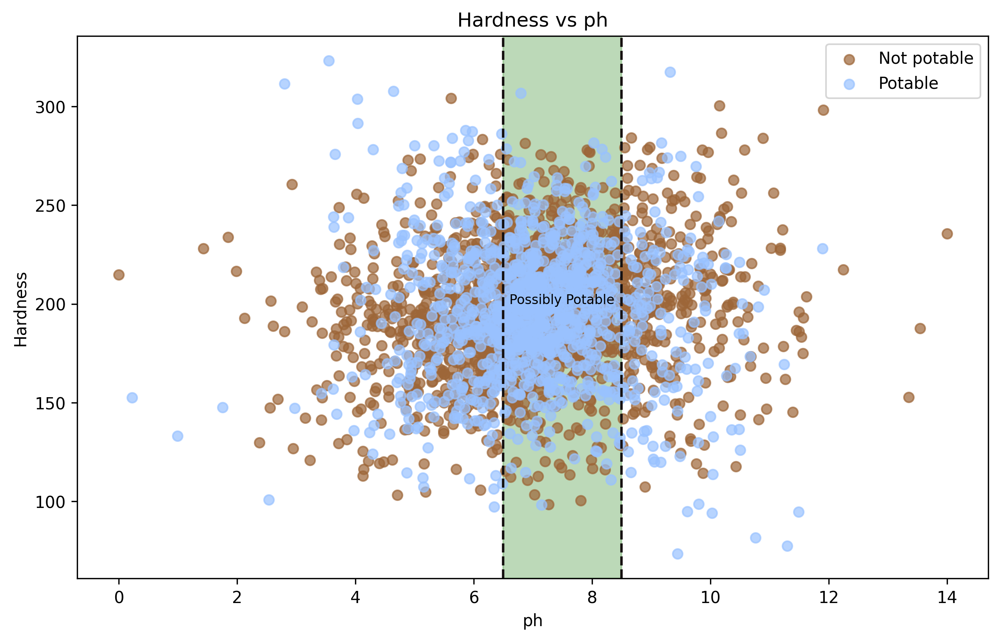

In [55]:
fig,ax = plot_scatter(df_no_missing,y_col="Hardness")

ax.axvline(x=6.5,color=colors["boundary"],linestyle="--")
ax.axvline(x=8.5,color=colors["boundary"],linestyle="--")

ax.axvspan(6.5,8.5,color=colors["ok"], alpha=0.4,zorder=0)
plt.text(6.6,200,"Possibly Potable",fontsize=8)
plt.show()


### Solids vs ph

#### Contradictions with project document
According to the document, the ideal leve of Solids in potable water is 500 mg/L and it is allowed to go up to 1000 mg/L.

What we see in the plot is shocking! This can not be just too mnay outliers. There is probably something wrong with the units of Sulfate, or some oter reasons. I keep the data the way it is and just flag issues

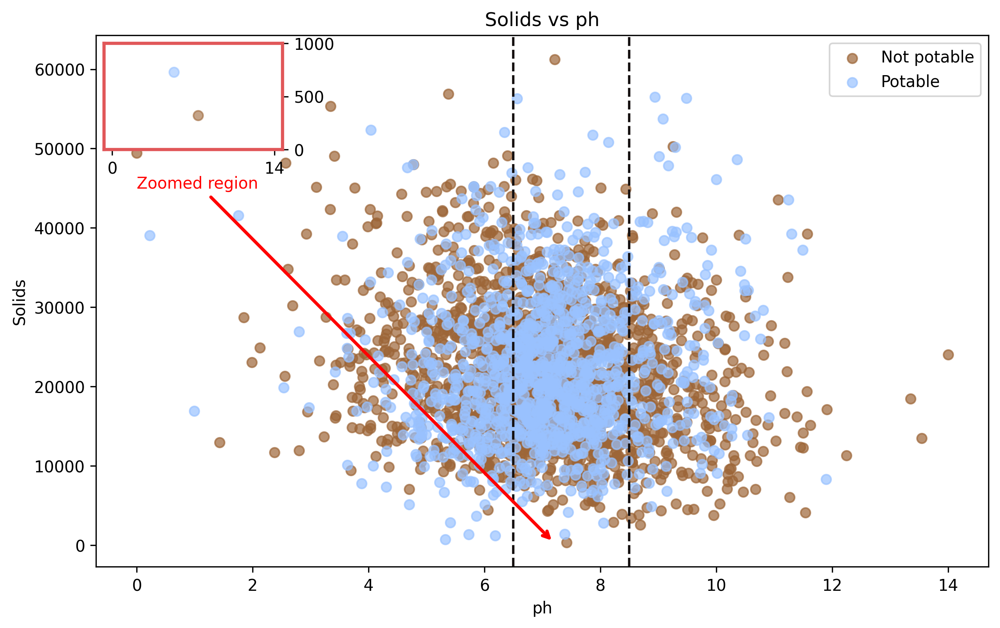

In [45]:
fig,ax = plot_scatter(df_no_missing,y_col="Solids")

ax.axvline(x=6.5,color=colors["boundary"],linestyle="--")
ax.axvline(x=8.5,color=colors["boundary"],linestyle="--")

# ax.axhline(y=500,color= colors["boundary"], linestyle="--")
# ax.axhline(y=1000,color= colors["boundary"], linestyle="--")

ax_inset = inset_axes(
    ax,
    width="20%",     # width of inset relative to main plot
    height="20%",    # height of inset
    loc="upper left"
)

# Plot the same data inside inset
ax_inset.scatter(
    df_no_missing.loc[df_no_missing["Potability"] == 0, "ph"],
    df_no_missing.loc[df_no_missing["Potability"] == 0, "Solids"],
    color=colors["not-potable"],
    alpha=0.6
)

ax_inset.scatter(
    df_no_missing.loc[df_no_missing["Potability"] == 1, "ph"],
    df_no_missing.loc[df_no_missing["Potability"] == 1, "Solids"],
    color=colors["potable"],
    alpha=0.6
)


# Zoom region
# ax_inset.set_xlim(6.5,8.5)
ax_inset.set_ylim(0, 1000)

# Optional: remove labels for cleaner look
ax_inset.set_xticks([0,14])
# ax_inset.set_yticks([])

ax_inset.yaxis.set_ticks_position("right")

# change the color of spines for better visibility
for spine in ax_inset.spines.values():
    spine.set_edgecolor(colors["not-ok"])
    spine.set_linewidth(2)
    
#annotation
ax.annotate("Zoomed region",
    xy=(7.2, 300),             # point in data
    xytext=(0, 45000),       # near the inset
    arrowprops=dict(
        arrowstyle="->",
        color="red",
        lw=2,
        connectionstyle="arc3"
    ),
    fontsize=10,
    color="red"
)  



    
# for automatic arrows of the zoomed area    
# from mpl_toolkits.axes_grid1.inset_locator import mark_inset
# 
# mark_inset(ax,ax_inset,loc1=2,loc2=4,fc="none",ec="red",lw=1.5)

plt.show()


### Cloramines vs ph

The accpeted are for potable water is green. As you can see a lot of data points are categorized potable outside this area.
Also, most of the datapoints exceed the nmax level of Cloramines for potable water and it is surprising that we have potable datapoints there! too noisy?

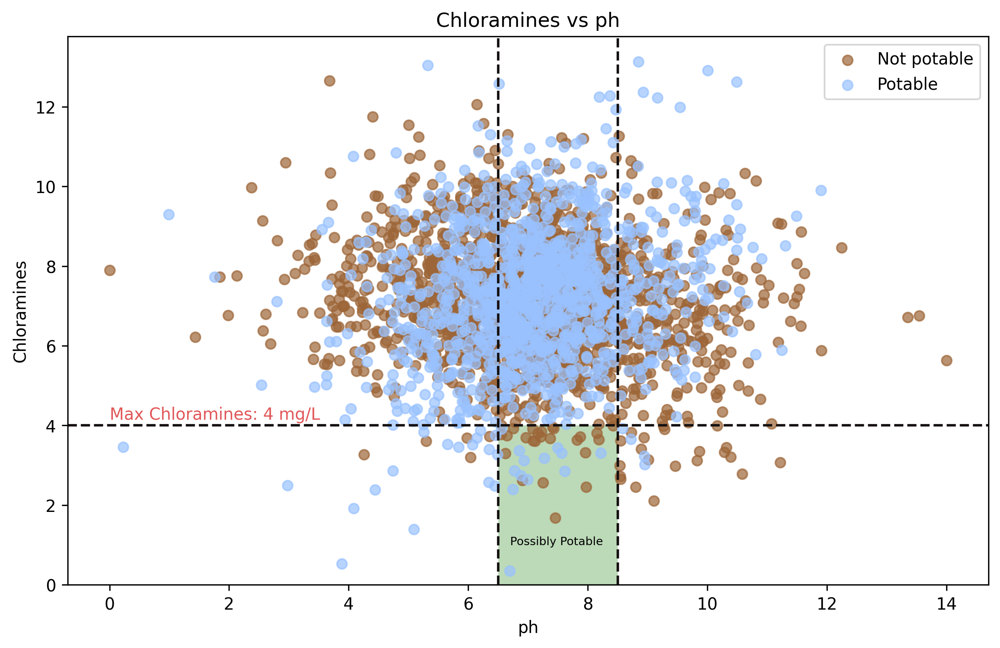

In [57]:

fig,ax = plot_scatter(df_no_missing,y_col="Chloramines")

ax.axvline(x=6.5,color=colors["boundary"],linestyle="--")
ax.axvline(x=8.5,color=colors["boundary"],linestyle="--")

ax.axhline(y=4,color= colors["boundary"], linestyle="--")
plt.text(0,4.15,"Max Chloramines: 4 mg/L",fontsize=10,color=colors["not-ok"])
plt.ylim(bottom=0)

# Rectangle limits
x_min, x_max = 6.5, 8.5
y_min, y_max = 0,4

# Add shaded rectangle
ax.add_patch(
    Rectangle(
        (x_min, y_min),          # bottom-left corner
        x_max - x_min,           # width
        y_max - y_min,           # height
        facecolor=colors["ok"],
        edgecolor="none",        
        alpha=0.4,
        zorder=0                 # behind the scatter points
    )
)

plt.text(6.7,1,"Possibly Potable",fontsize=7)


plt.show()


### Sulfate vs ph

The sulfate levels of datapoints are within a limited range , all accepted for potable water, though none are in the usual area!

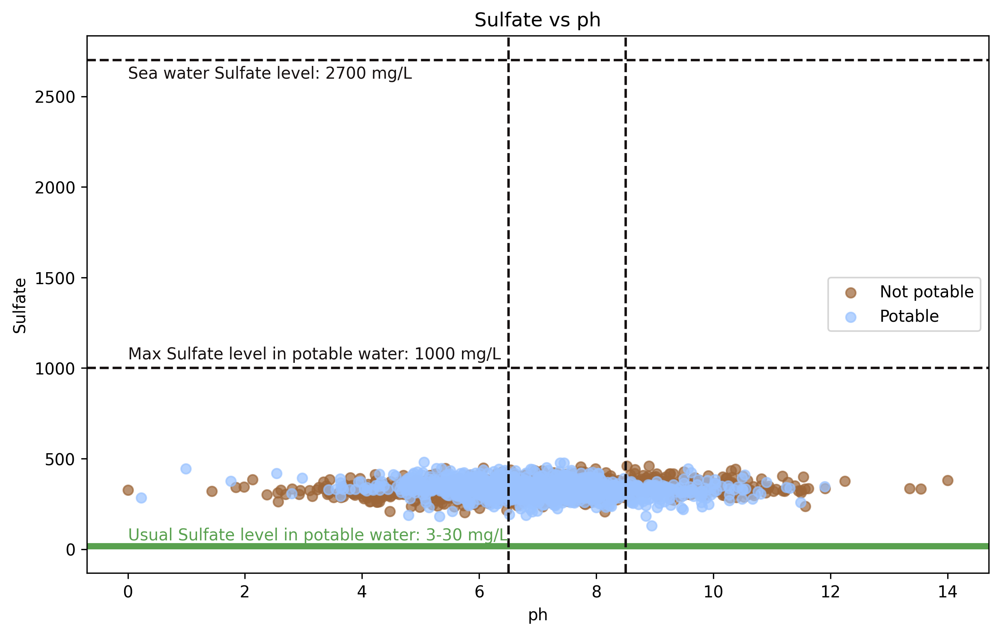

In [ ]:
fig,ax = plot_scatter(df_no_missing,y_col="Sulfate")

ax.axvline(x=6.5,color=colors["boundary"],linestyle="--")
ax.axvline(x=8.5,color=colors["boundary"],linestyle="--")

ax.axhline(y=2700,color=colors["boundary"],linestyle="--")
ax.axhline(y=1000,color=colors["boundary"],linestyle="--")
ax.axhspan(3,30,color=colors["ok"])

plt.text(0,2600,"Sea water Sulfate level: 2700 mg/L",color=colors["boundary"],fontsize=9)
plt.text(0,1050,"Max Sulfate level in potable water: 1000 mg/L",color=colors["boundary"],fontsize=9)
plt.text(0,50,"Usual Sulfate level in potable water: 3-30 mg/L",color=colors["ok"],fontsize=9)


plt.show()


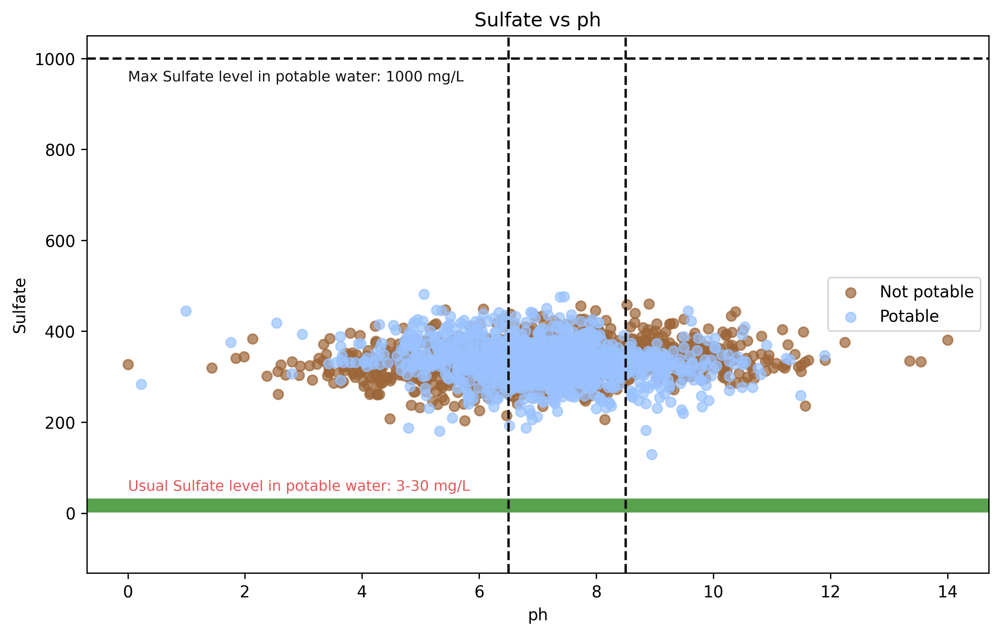

In [68]:
# better plot without the sea level 

fig,ax = plot_scatter(df_no_missing,y_col="Sulfate")


ax.axvline(x=6.5,color=colors["boundary"],linestyle="--")
ax.axvline(x=8.5,color=colors["boundary"],linestyle="--")

ax.axhline(y=2700,color=colors["boundary"],linestyle="--")
ax.axhline(y=1000,color=colors["boundary"],linestyle="--")
ax.axhspan(3,30,color=colors["ok"])

plt.text(0,950,"Max Sulfate level in potable water: 1000 mg/L",color=colors["boundary"],fontsize=9)
plt.text(0,50,"Usual Sulfate level in potable water: 3-30 mg/L",color=colors["not-ok"],fontsize=9)

plt.ylim(top=1050)
plt.show()


### Conductivity vs ph


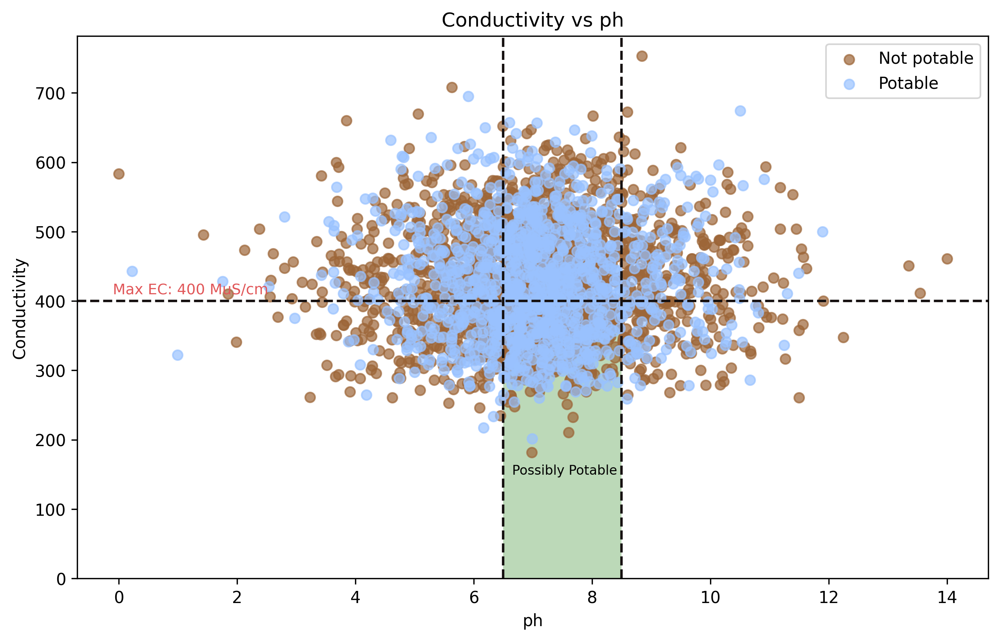

In [73]:

fig,ax = plot_scatter(df_no_missing,y_col="Conductivity")

ax.axvline(x=6.5,color=colors["boundary"],linestyle="--")
ax.axvline(x=8.5,color=colors["boundary"],linestyle="--")

ax.axhline(y=400,color=colors["boundary"],linestyle="--")

plt.text(-0.10,410,"Max EC: 400 MuS/cm",color=colors["not-ok"],fontsize=9)

plt.ylim(bottom=0)
# Rectangle limits
x_min, x_max = 6.5, 8.5
y_min, y_max = 0,400

# Add shaded rectangle
ax.add_patch(
    Rectangle(
        (x_min, y_min),          # bottom-left corner
        x_max - x_min,           # width
        y_max - y_min,           # height
        facecolor=colors["ok"],
        edgecolor="none",        
        alpha=0.4,
        zorder=0                 # behind the scatter points
    )
)

plt.text(6.65,150,"Possibly Potable",fontsize=8)


plt.show()


### Organic Carbon vs ph
The data seems so inaccurate!

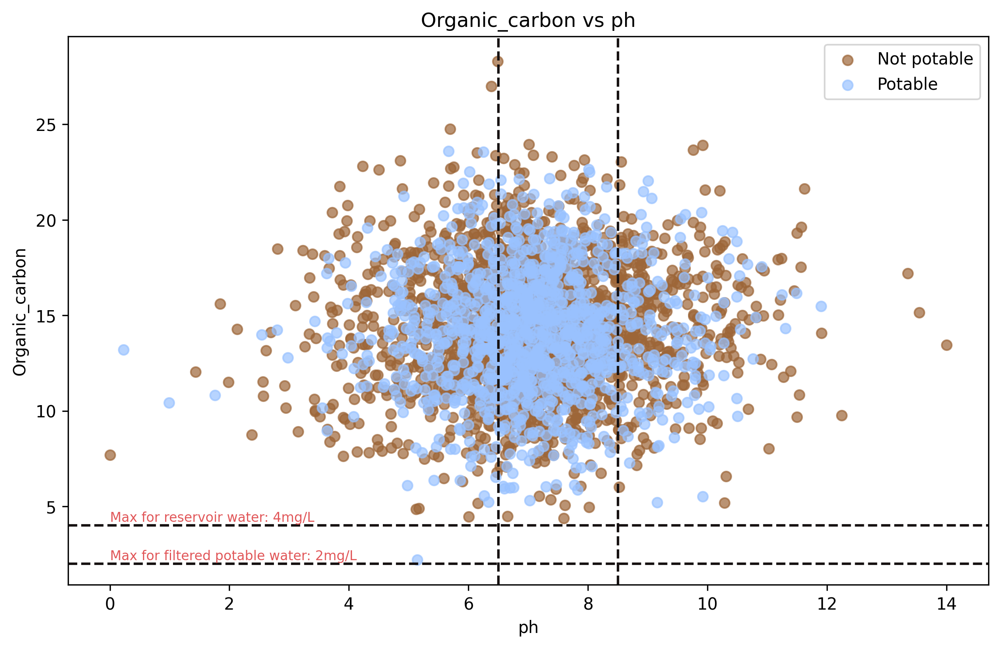

In [20]:
fig,ax = plot_scatter(df_no_missing,y_col="Organic_carbon")

ax.axvline(x=6.5,color=colors["boundary"],linestyle="--")
ax.axvline(x=8.5,color=colors["boundary"],linestyle="--")

ax.axhline(y=4,color=colors["boundary"],linestyle="--")
ax.axhline(y=2,color=colors["boundary"],linestyle="--")


plt.text(0,2.2,"Max for filtered potable water: 2mg/L",color=colors["not-ok"],fontsize=8)
plt.text(0,4.2,"Max for reservoir water: 4mg/L",color=colors["not-ok"],fontsize=8)
plt.show()


### Trihalomethanes vs ph

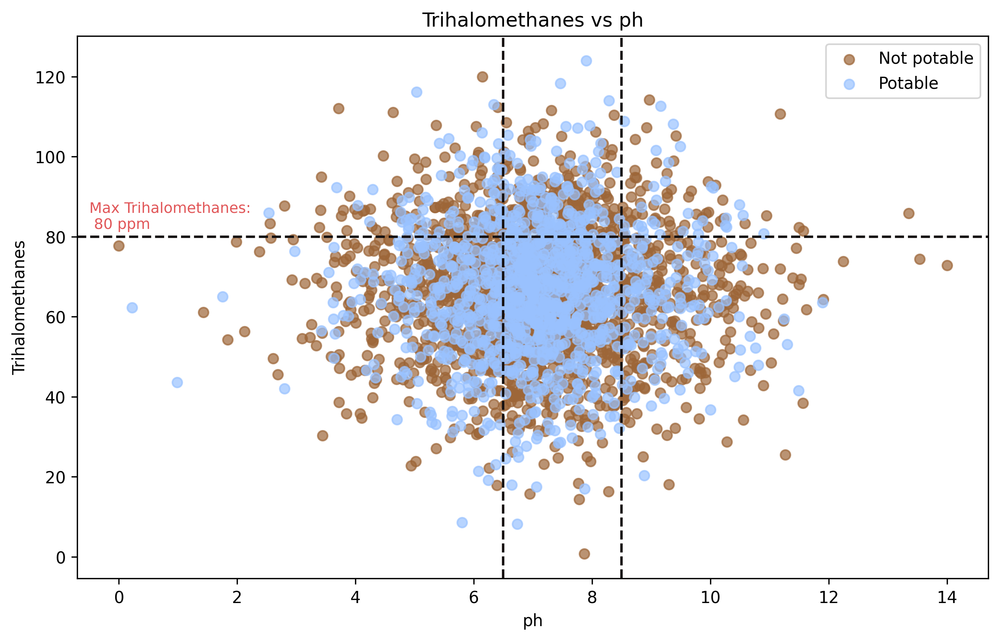

In [21]:
fig,ax = plot_scatter(df_no_missing,y_col="Trihalomethanes")

ax.axvline(x=6.5,color=colors["boundary"],linestyle="--")
ax.axvline(x=8.5,color=colors["boundary"],linestyle="--")

ax.axhline(y=80,color=colors["boundary"],linestyle="--")

plt.text(-0.5,82,"Max Trihalomethanes:\n 80 ppm",color=colors["not-ok"],fontsize=9)
plt.show()


### Check Trihalomethanes relations with Organic_carbon
In the project document it is stated that the level of Trihalomethanes in water depends on the level of Organic_carbon.
The plot below is supposed to help find this dependency between these two features.
However, as shown below, there is no correlation between these two features!

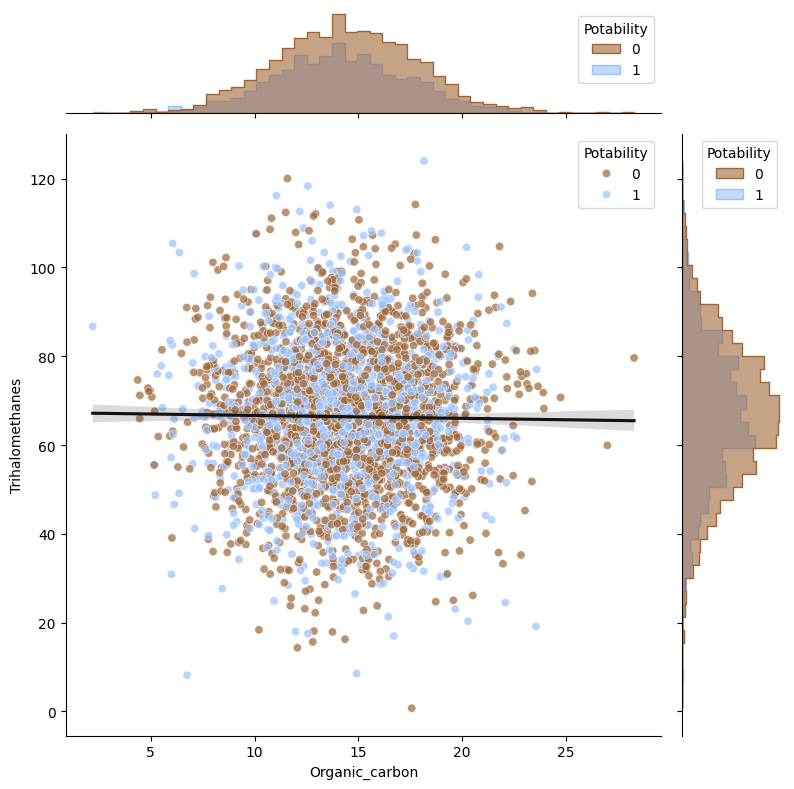

In [22]:
g = sns.JointGrid(data=df_no_missing,x="Organic_carbon",y="Trihalomethanes",height=8)

# Scatter points with hue
sns.scatterplot(data=df_no_missing,x="Organic_carbon",y="Trihalomethanes",hue="Potability",
    palette={
        0: colors["not-potable"],
        1: colors["potable"]
    },
    alpha=0.7,
    ax=g.ax_joint)

# Overall regression line
sns.regplot(data=df_no_missing,x="Organic_carbon",y="Trihalomethanes",scatter=False,color=colors["boundary"],ax=g.ax_joint)

# Marginal distributions
sns.histplot(data=df_no_missing,x="Organic_carbon",hue="Potability",
    palette={
        0: colors["not-potable"],
        1: colors["potable"]
    },
    element="step",
    alpha=0.6,
    ax=g.ax_marg_x
)

sns.histplot(
    data=df_no_missing,
    y="Trihalomethanes",
    hue="Potability",
    palette={
        0: colors["not-potable"],
        1: colors["potable"]
    },
    element="step",
    alpha=0.6,
    ax=g.ax_marg_y
)

plt.show()

### Turbidity vs ph
The data is scattred everywhere. I don't know what to say!

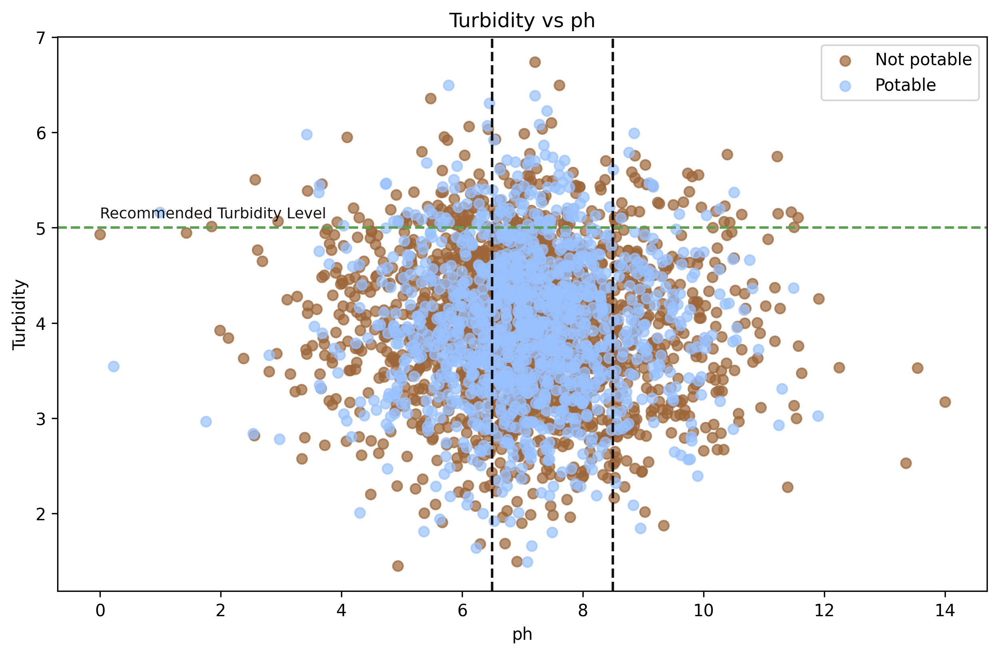

In [23]:
#Turbidity
fig,ax = plot_scatter(df_no_missing,y_col="Turbidity")

ax.axvline(x=6.5,color=colors["boundary"],linestyle="--")
ax.axvline(x=8.5,color=colors["boundary"],linestyle="--")

ax.axhline(y=5,color=colors["ok"],linestyle="--")

plt.text(0,5.1,"Recommended Turbidity Level",color= colors["boundary"],fontsize=9)
plt.show()

### Correlation of features with Target column (Potability)

No noticable correlation between feature and the target. I am wondering why???

In [82]:
corr = df_no_missing.corr(numeric_only=True)["Potability"].sort_values(
    key=abs,
    ascending=False
)
print(corr)

Potability         1.000000
Organic_carbon    -0.036048
Solids             0.031812
Chloramines        0.026719
Sulfate           -0.015281
Hardness          -0.010453
Turbidity          0.007268
Trihalomethanes    0.007130
Conductivity      -0.006069
ph                -0.003562
Name: Potability, dtype: float64


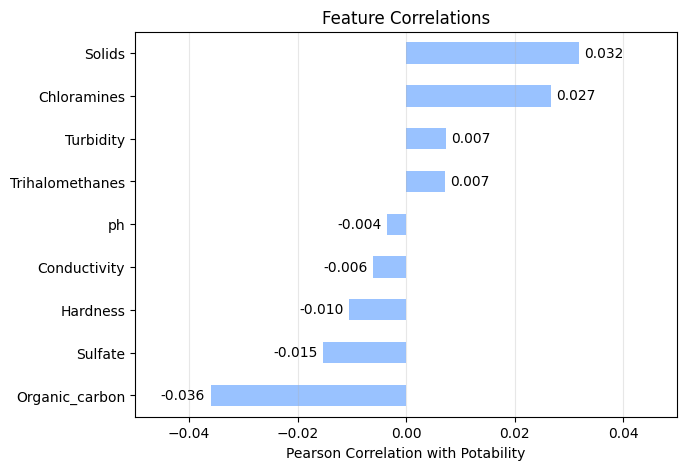

In [81]:
corr = (df_no_missing.corr(numeric_only=True)["Potability"].drop("Potability").sort_values())

fig, ax = plt.subplots(figsize=(7, 5))

corr.plot.barh(ax=ax,color=colors["potable"])

# Add value labels
for bar in ax.patches:
    width = bar.get_width()
    y = bar.get_y() + bar.get_height() / 2

    ax.text(
        width + 0.001 if width >= 0 else width - 0.001,  # slight offset
        y,
        f"{width:.3f}",
        va="center",
        ha="left" if width >= 0 else "right",
        fontsize=10
    )

ax.set_xlabel("Pearson Correlation with Potability")
ax.set_title("Feature Correlations")
ax.set_xlim(left=-0.05, right=0.05)
ax.grid(axis="x", alpha=0.3)

plt.show()